In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [74]:
ce_raw_data = pd.read_csv('../data/CE_raw_data.csv')
ce_raw_data = ce_raw_data.drop(columns=['Unnamed: 0'])

# Data Understanding

In [193]:
print(len(ce_raw_data))
ce_raw_data.head(10)

252285


,cell,time,x,y,z,size
0,AB,1,113.254827,34.087484,-0.927981,53.0
1,AB,2,153.254827,-7.912516,-0.427981,68.0
2,AB,3,156.254827,-16.912516,-0.927981,48.0
3,AB,4,150.254827,-28.912516,-0.927981,50.0
4,ABa,5,178.254827,20.087484,-0.627981,70.0
5,ABa,6,180.254827,7.087484,-0.027981,71.0
6,ABa,7,212.254827,3.087484,-0.427981,75.0
7,ABa,8,231.254827,-3.912516,-0.427981,79.0
8,ABa,9,237.254827,9.087484,-0.227981,82.0
9,ABa,10,240.254827,16.087484,1.272019,86.0


In [196]:
ce_raw_data.dtypes

cell     object
time      int64
x       float64
y       float64
z       float64
size    float64
dtype: object

In [197]:
ce_raw_data.describe()

,time,x,y,z,size
count,252285.000000,2.522850e+05,2.522850e+05,2.522850e+05,252285.000000
mean,112.561841,-6.390995e-14,1.609285e-14,-1.845775e-15,39.205066
std,33.465553,1.404142e+02,9.464378e+01,5.949278e+00,8.131437
min,-16.000000,-2.947452e+02,-2.189125e+02,-1.242798e+01,24.000000
25%,92.000000,-1.157452e+02,-7.891252e+01,-4.927981e+00,34.000000
50%,117.000000,-4.745173e+00,-9.125156e-01,7.201855e-02,37.000000
75%,135.000000,1.152548e+02,7.808748e+01,5.172019e+00,43.000000
max,190.000000,3.342548e+02,2.100875e+02,1.317202e+01,103.000000


#### Time

In [76]:
ce_raw_data['time'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [77]:
ce_raw_data[ce_raw_data['time'] < 0]

,cell,time,x,y,z,size
155380,P1,-16,479.0,189.0,14.4,88.0
155381,P1,-15,489.0,190.0,17.1,88.0
155382,P1,-14,489.0,194.0,17.1,69.0
155383,P1,-13,490.0,199.0,17.0,50.0


#### Size of Cells

In [78]:
ce_raw_data['size'].min(), ce_raw_data['size'].max()

(np.float64(24.0), np.float64(103.0))

#### Frequecy count of Cells

In [198]:
ce_raw_data['cell'].nunique()

786

In [80]:
# Cells having the logest life: top 10 cells -> since they would occur for more #times
ce_raw_data['cell'].value_counts()[:10]

cell
Caapa      806
Eprp       777
Eplp       756
Epra       720
Earp       710
Epla       692
Ealp       688
Eara       686
Eala       681
MSaaapp    632
Name: count, dtype: int64

In [195]:
ce_raw_data[['cell', 'time']].value_counts()

cell       time
Eara       102     14
Epla       101     14
           103     14
           104     14
Eprp       97      14
                   ..
ABplapaap  162      1
           161      1
           160      1
           159      1
Z3         160      1
Name: count, Length: 57079, dtype: int64

## Lineage data

In [83]:
data_path = '/Users/mehularora/Downloads/'
lineage_data = pd.read_excel(f'{data_path}cell-phenotype-lineage-data.xlsx', sheet_name='daughter-of-database',
                             engine='openpyxl', usecols=['CELL NAME', 'CELL NAME.1'])
lineage_data.rename(
    columns={'CELL NAME': 'cell', 'CELL NAME.1': 'mother'}, inplace=True)

In [84]:
print(len(lineage_data))
lineage_data.head()

1865


,cell,mother
0,AB,P0
1,ABa,AB
2,ABal,ABa
3,ABala,ABal
4,ABalaa,ABala


In [85]:
'''
ToDos:
1. Find the average position of the cells - to find the actual cell position (watch youtube video also to confirm)

NOTES: 
1. find the median of the coordignates to create a normalized coordinate system (0, 0, 0) at the center
2. For a single cell, take the mean position of the cell at all time points
3. Use that as a way to characterize the cell position, helps to get the spaccial position for the cell
####

2. What to do with the cell size? Take min and max value of the cell size?
3. Construct a static graph from overall time
4. Consturct static hypergraph from overall time

5. [Alternate: ask Bradly] - Construct a dynamic graph from the data: graph at every time point
6. Costruct hypergraph from the data: hypergraph at every time point - READ the paper from ideas

Rnd thoughts:
1. use the knn_graph in PyG to make a knn graph of the cells - a fully connected graph? or a graph with a threshold distance? limit number of edges?
2. you can make a static positional graph, and dynamic positional graph as well (like Jihang Li)
'''

'\nToDos:\n1. Find the average position of the cells - to find the actual cell position (watch youtube video also to confirm)\n\nNOTES: \n1. find the median of the coordignates to create a normalized coordinate system (0, 0, 0) at the center\n2. For a single cell, take the mean position of the cell at all time points\n3. Use that as a way to characterize the cell position, helps to get the spaccial position for the cell\n####\n\n2. What to do with the cell size? Take min and max value of the cell size?\n3. Construct a static graph from overall time\n4. Consturct static hypergraph from overall time\n\n5. [Alternate: ask Bradly] - Construct a dynamic graph from the data: graph at every time point\n6. Costruct hypergraph from the data: hypergraph at every time point - READ the paper from ideas\n\nRnd thoughts:\n1. use the knn_graph in PyG to make a knn graph of the cells - a fully connected graph? or a graph with a threshold distance? limit number of edges?\n2. you can make a static posit

## Data Preparation

### Normalized coordinate system


In [86]:
ce_raw_data.head()

,cell,time,x,y,z,size
0,AB,1,454.0,286.0,14.0,53.0
1,AB,2,494.0,244.0,14.5,68.0
2,AB,3,497.0,235.0,14.0,48.0
3,AB,4,491.0,223.0,14.0,50.0
4,ABa,5,519.0,272.0,14.3,70.0


In [87]:
# norlaize the coordinates
ce_raw_data['x'] = ce_raw_data['x'] - ce_raw_data['x'].mean() #/ max - min
ce_raw_data['y'] = ce_raw_data['y'] - ce_raw_data['y'].mean()
ce_raw_data['z'] = ce_raw_data['z'] - ce_raw_data['z'].mean()

In [88]:
# find the unique cell, and then find the mean position of the cell, make a pandas dataframe
unique_cells = ce_raw_data['cell'].unique()
cell_positions = []
min_sizes = []
max_sizes = []
for cell in unique_cells:
    cell_data = ce_raw_data[ce_raw_data['cell'] == cell]
    cell_positions.append(cell_data[['x', 'y', 'z']].mean().values)
    min_sizes.append(cell_data['size'].min())
    max_sizes.append(cell_data['size'].max())

cell_positions = np.array(cell_positions)
min_sizes = np.array(min_sizes)
max_sizes = np.array(max_sizes)

# convert to pandas dataframe
cell_stats_df = pd.DataFrame(cell_positions, columns=['x', 'y', 'z'])
cell_stats_df['min_size'] = min_sizes
cell_stats_df['max_size'] = max_sizes
cell_stats_df['cell'] = unique_cells

In [89]:
print(len(cell_stats_df))
cell_stats_df.head()

786


,x,y,z,min_size,max_size,cell
0,-36.850436,-8.649358,0.250966,48.0,100.0,AB
1,-68.586082,-0.367061,0.636791,41.0,95.0,ABa
2,-108.174803,-17.719923,0.061648,42.0,86.0,ABal
3,-105.560460,2.042898,0.389216,44.0,79.0,ABala
4,-114.504667,-12.317579,0.448390,34.0,73.0,ABalaa


### Lineage data

In [90]:
print(len(lineage_data))
lineage_data.head()

1865


,cell,mother
0,AB,P0
1,ABa,AB
2,ABal,ABa
3,ABala,ABal
4,ABalaa,ABala


In [101]:
### Combine the cell stats with the lineage data
new_stats_df = cell_stats_df.merge(lineage_data, how='inner', on='cell')

In [102]:
print(len(new_stats_df))
new_stats_df.head()

780


,x,y,z,min_size,max_size,cell,mother
0,-36.850436,-8.649358,0.250966,48.0,100.0,AB,P0
1,-68.586082,-0.367061,0.636791,41.0,95.0,ABa,AB
2,-108.174803,-17.719923,0.061648,42.0,86.0,ABal,ABa
3,-105.560460,2.042898,0.389216,44.0,79.0,ABala,ABal
4,-114.504667,-12.317579,0.448390,34.0,73.0,ABalaa,ABala


#### Cells not present in the Lineage

In [105]:
# find cells which are not in the lineage data
missing_cells = set(cell_stats_df['cell']) - set(new_stats_df['cell'])

In [106]:
missing_cells

{'P1', 'P2', 'P3', 'P4', 'Z2', 'Z3'}

The above cells doesn't have any mother, hence not present in the Lineage data (cell column).

In [107]:
# add the missing cells to the new_stats_df
missing_cells_df = cell_stats_df[cell_stats_df['cell'].isin(missing_cells)]
missing_cells_df['mother'] = np.nan

missing_cells_df.head()

/var/folders/nk/2cs25nt94jb5c55rcj7mkdhw0000gn/T/ipykernel_79030/2610413939.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing_cells_df['mother'] = np.nan


,x,y,z,min_size,max_size,cell,mother
511,137.754827,12.158913,0.793447,35.0,103.0,P1,NaN
643,105.378115,6.409402,0.219964,28.0,91.0,P2,NaN
705,131.715656,5.787945,-0.526599,40.0,79.0,P3,NaN
721,73.299827,-20.147516,1.272852,30.0,73.0,P4,NaN
722,65.680037,-0.631843,-0.573360,24.0,57.0,Z2,NaN


In [108]:
# combine the missing cells with the new_stats_df
new_stats_df = pd.concat([new_stats_df, missing_cells_df], axis=0)
print(len(new_stats_df))

786


# Graph Creation

In [36]:
'''
2-kind of graphs:
1. Graph created from the cell positions
- nodes: cells
- edges: distance between the cells
- weight: distance between the cells
- edge weight: distance between the cells
- node properties: cell size, cell position, mother
- fully connected graph


2. Graph created from the cell lineage
- nodes: cells
- edges: mother-daughter relationship between the cells
- weight: time difference between the cells???

'''

'\n2-kind of graphs:\n1. Graph created from the cell positions\n- nodes: cells\n- edges: distance between the cells\n- weight: distance between the cells\n- edge weight: distance between the cells\n- node properties: cell size, cell position, mother\n\n\n2. Graph created from the cell lineage\n- nodes: cells\n- edges: mother-daughter relationship between the cells\n- weight: time difference between the cells???\n\n'

In [115]:
import torch
from torch_geometric.data import Data
from torch_geometric.nn import knn_graph

In [116]:
# Calculate distances and create edges
positions = new_stats_df[['x', 'y', 'z']].values
num_nodes = positions.shape[0]

# Create fully connected edges
edges = []
for i in range(num_nodes):
    for j in range(i + 1, num_nodes):
        dist = np.linalg.norm(positions[i] - positions[j])
        edges.append([i, j, dist])
        # Add both directions for an undirected graph
        edges.append([j, i, dist])

edge_index = torch.tensor([[edge[0], edge[1]]
                          for edge in edges], dtype=torch.long).t().contiguous()
edge_attr = torch.tensor([edge[2] for edge in edges], dtype=torch.float)

# Node features
node_features = torch.tensor(positions, dtype=torch.float)
node_size = torch.tensor(
    new_stats_df[['min_size', 'max_size']].values, dtype=torch.float)

# Create graph data object
data = Data(
    x=node_features,
    edge_index=edge_index,
    edge_attr=edge_attr,
    node_size=node_size,
    node_names=new_stats_df['cell'].values,
    mother_names=new_stats_df['mother'].values
)

In [117]:
data

Data(x=[786, 3], edge_index=[2, 617010], edge_attr=[617010], node_size=[786, 2], node_names=[786], mother_names=[786])

In [119]:
# from torch_geometric.utils import to_networkx
# import networkx as nx
# import matplotlib.pyplot as plt

# # Convert PyG graph to NetworkX graph for visualization
# G = to_networkx(data, node_attrs=['x', 'node_size'], edge_attrs=['edge_attr'])

# # Position nodes using the original positions
# pos = {i: (data.x[i][0].item(), data.x[i][1].item())
#        for i in range(data.num_nodes)}

# # Draw the graph
# plt.figure(figsize=(10, 8))
# nx.draw(G, pos, with_labels=True, node_size=[
#         100 * size[1].item() for size in data.node_size], node_color='skyblue', font_size=10)
# edge_labels = {(edge[0].item(), edge[1].item()): f"{
#     edge[2].item():.2f}" for edge in zip(data.edge_index.t(), data.edge_attr)}
# nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')
# plt.show()

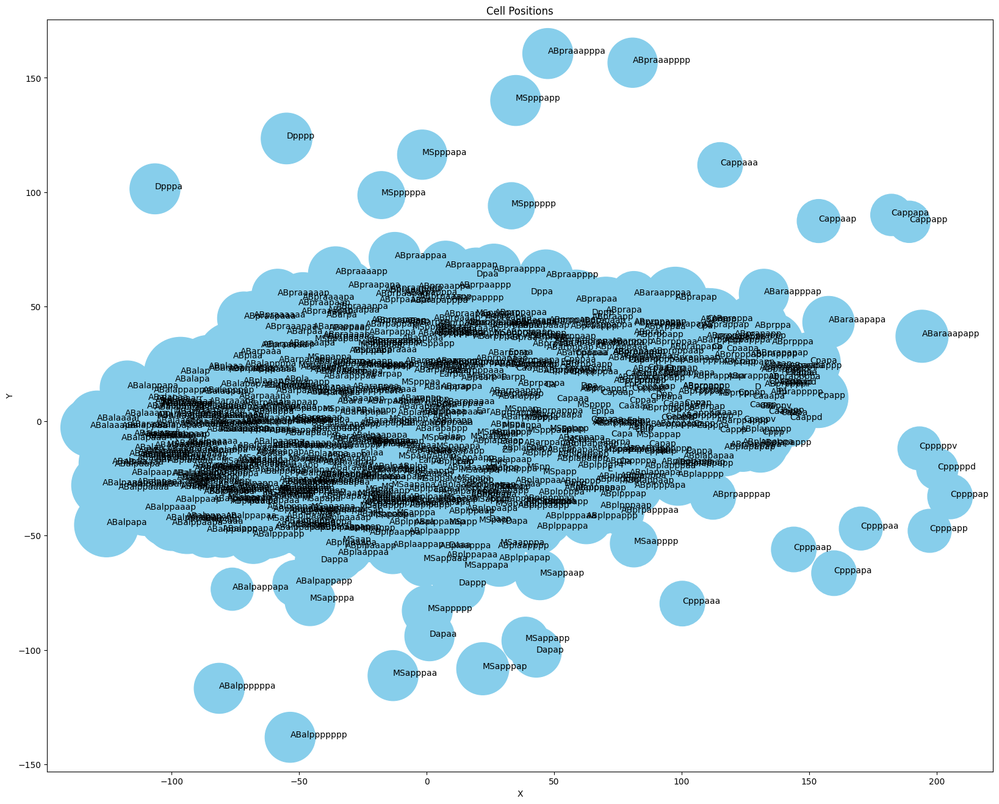

In [121]:
# plot all the nodes based o the
# ir position
plt.figure(figsize=(20, 16))
plt.scatter(data.x[:, 0].numpy(), data.x[:, 1].numpy(),
            s=100 * data.node_size[:, 1].numpy(), c='skyblue')

for i, cell in enumerate(data.node_names):
    plt.text(data.x[i, 0].item(), data.x[i, 1].item(), cell, fontsize=10)

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Cell Positions')
plt.show()

# Spatial Hypergraph

### 1. Distance Threshold-based Approach

In [168]:
# create a function to create and plot hypergraph, arguemnt as threshold
def create_hypergraph(threshold=50): # num_hyeredges = #cells = 786
    positions = new_stats_df[['x', 'y', 'z']].values
    nested_dict = {}
    # Group nodes by proximity
    for i in range(len(positions)):
        nested_dict[i] = [new_stats_df.iloc[i]['cell']]
        for j in range(i + 1, len(positions)):
            if np.linalg.norm(positions[i] - positions[j]) < threshold:
                nested_dict[i].append(new_stats_df.iloc[j]['cell'])

    H = hnx.Hypergraph(nested_dict)
    return H

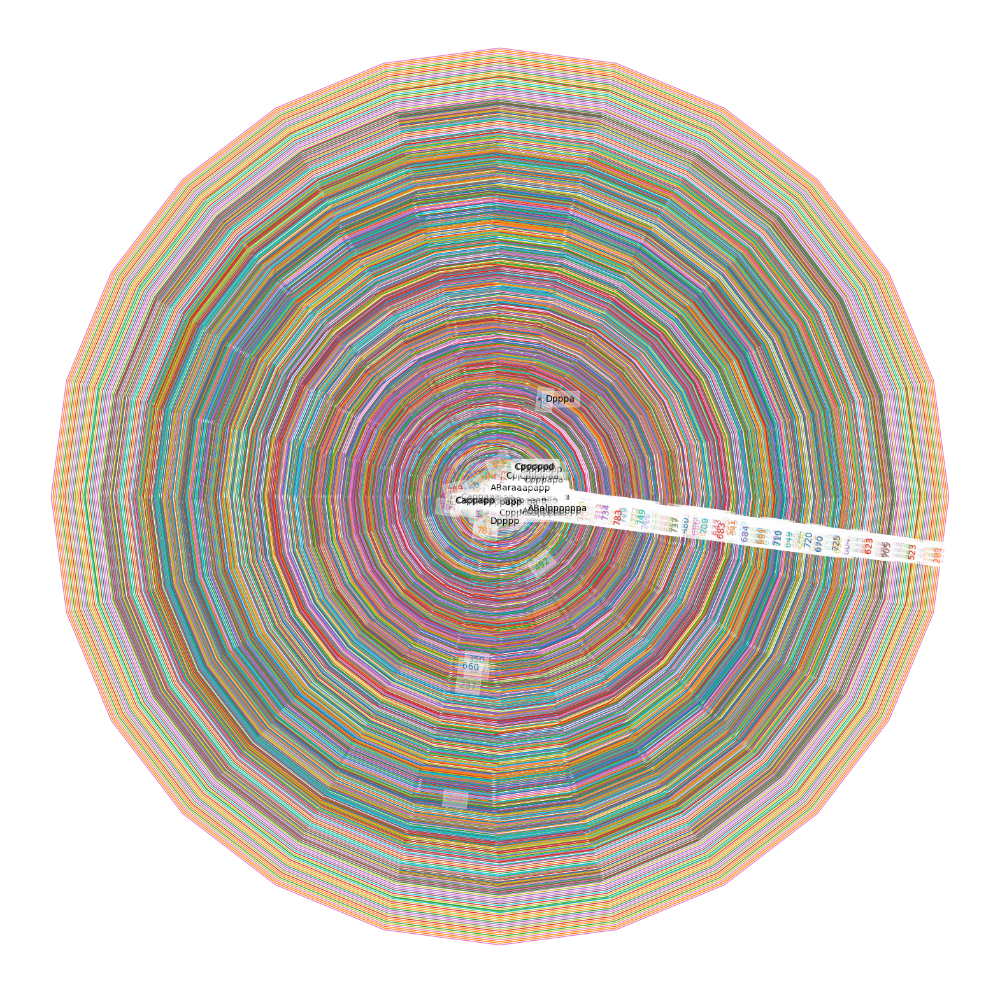

In [170]:
H = create_hypergraph(50)
plt.subplots(figsize=(20, 20))
hnx.draw(H)

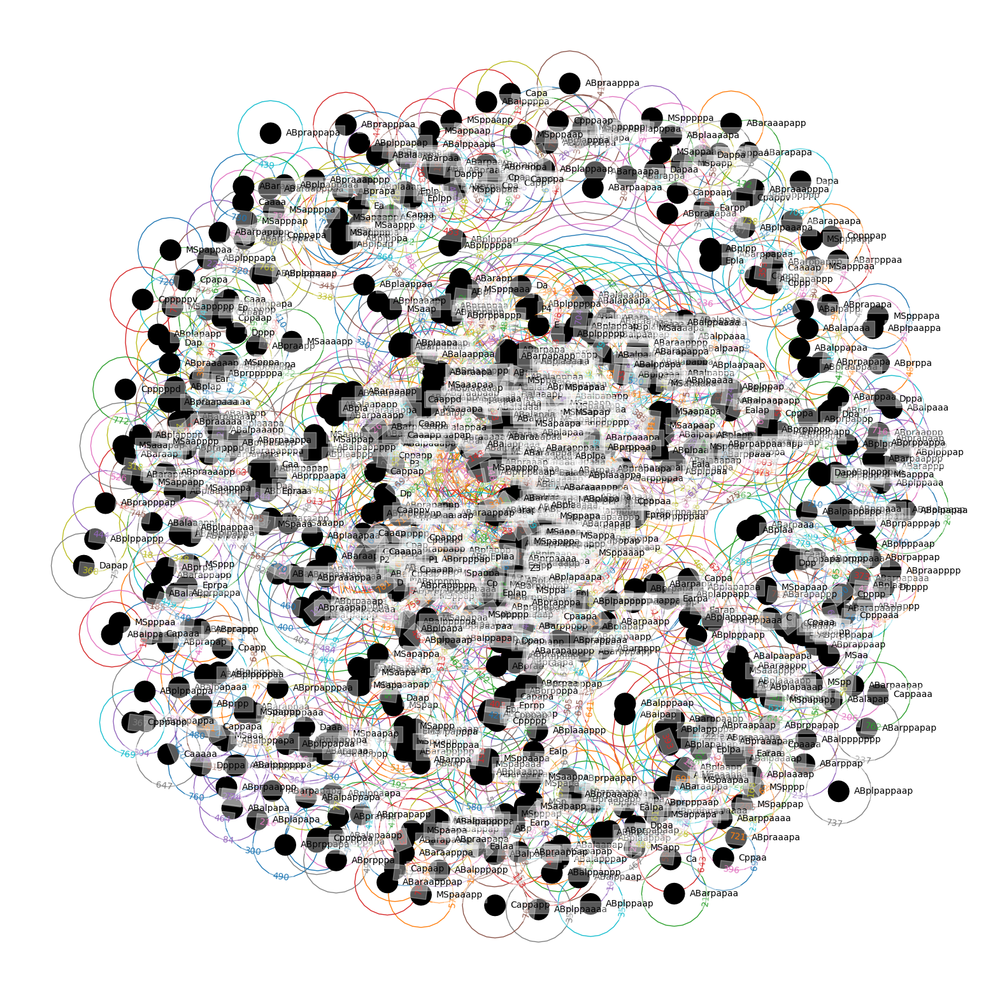

In [169]:
H = create_hypergraph(5)
plt.subplots(figsize=(20, 20))
hnx.draw(H)

### 2. Clustering-based hypergraph

In [186]:
from sklearn.cluster import DBSCAN

# Perform DBSCAN clustering
clustering = DBSCAN(eps=5, min_samples=2).fit(positions)
labels = clustering.labels_

list_of_lists = []
# Add nodes to hyperedges based on clusters
count = 0
for cluster_id in set(labels):
    count += 1
    if cluster_id != -1:  # Ignore noise points
        members = new_stats_df['cell'][labels == cluster_id].tolist()
        list_of_lists.append(members)
    else:
        # add the noise points to the list
        members = new_stats_df['cell'][labels == cluster_id].tolist()
        list_of_lists.extend(members)

H = hnx.Hypergraph(list_of_lists)

In [200]:
def create_hypergraph_DBSCAN(eps, min_samples, include_noise):
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(positions)
    labels = clustering.labels_

    list_of_lists = []
    # Add nodes to hyperedges based on clusters
    count = 0
    for cluster_id in set(labels):
        count += 1
        if cluster_id != -1:  # Ignore noise points
            members = new_stats_df['cell'][labels == cluster_id].tolist()
            list_of_lists.append(members)
        elif include_noise:
            # add the noise points to the list
            members = new_stats_df['cell'][labels == cluster_id].tolist()
            list_of_lists.extend(members)

    H = hnx.Hypergraph(list_of_lists)
    return H

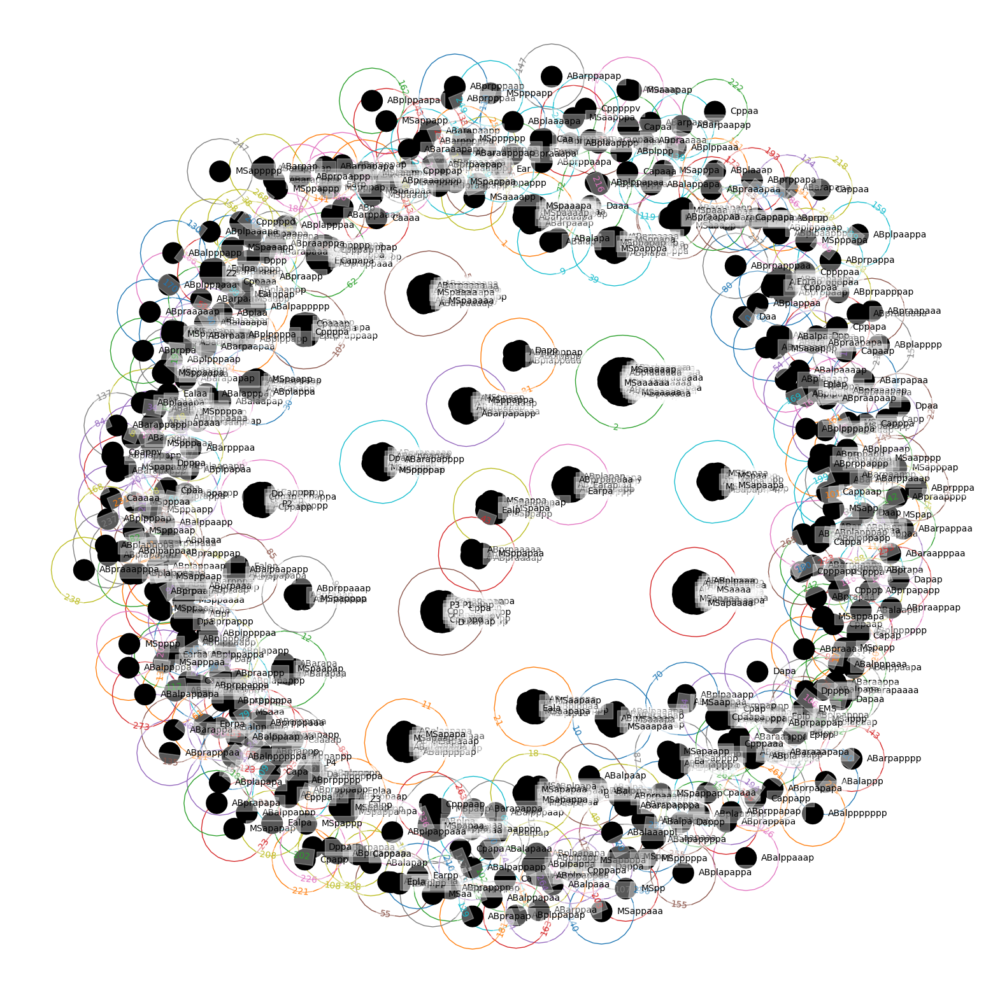

In [201]:
H = create_hypergraph_DBSCAN(5, 2, True)
plt.subplots(figsize=(20, 20))
hnx.draw(H)

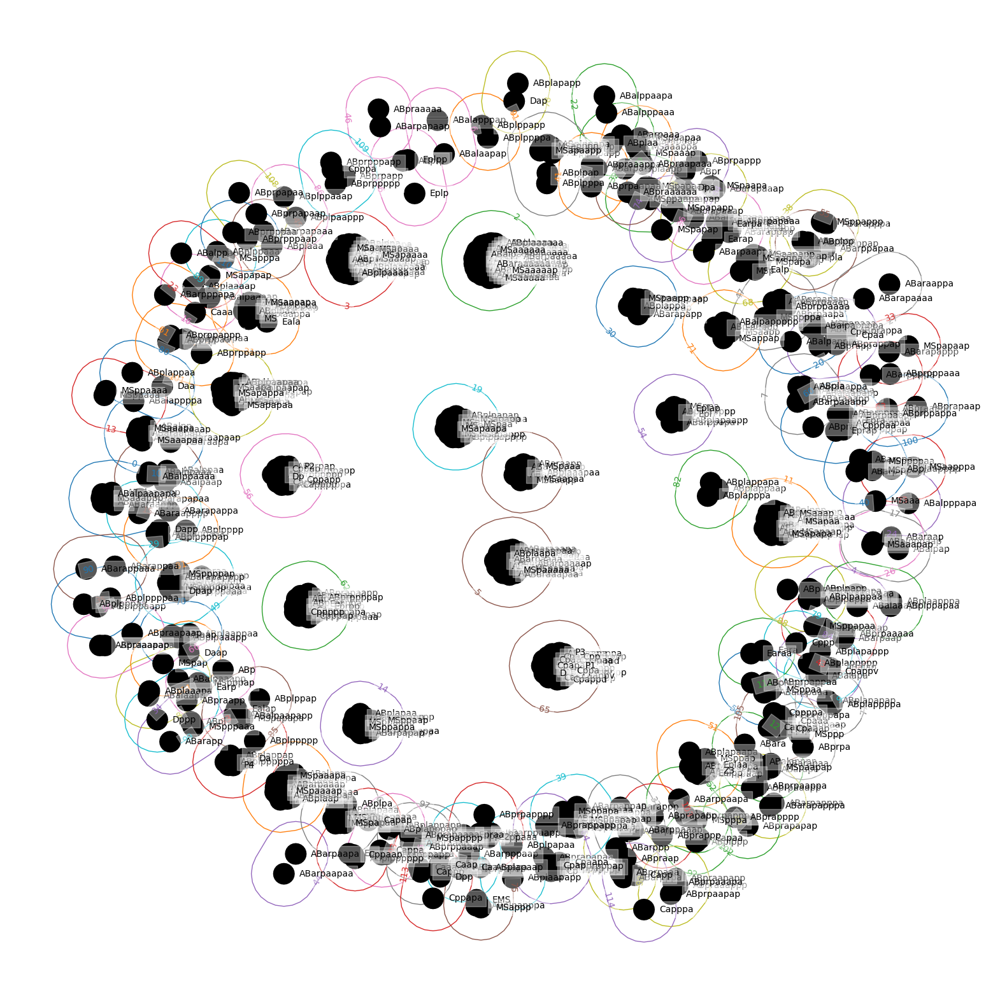

In [202]:
H = create_hypergraph_DBSCAN(5, 2, False)
plt.subplots(figsize=(20, 20))
hnx.draw(H)

# Other ways of creating Hyperedges (Lineage data)

## Hyperedges based on common parent

In [129]:
import hypernetx as hnx
import pandas as pd

# Create a hypergraph based on 'mother' relationships
H = hnx.Hypergraph()
hypergraph_dict = {}
# Group by 'mother' and add each group as a hyperedge
for mother, group in new_stats_df.groupby('mother'):
    hypergraph_dict[mother] = group['cell'].tolist()

H = hnx.Hypergraph(hypergraph_dict)

# Visualize the hypergraph
# hnx.draw(H, with_labels=True)

In [132]:
print(H)

None <class 'hypernetx.classes.hypergraph.Hypergraph'>


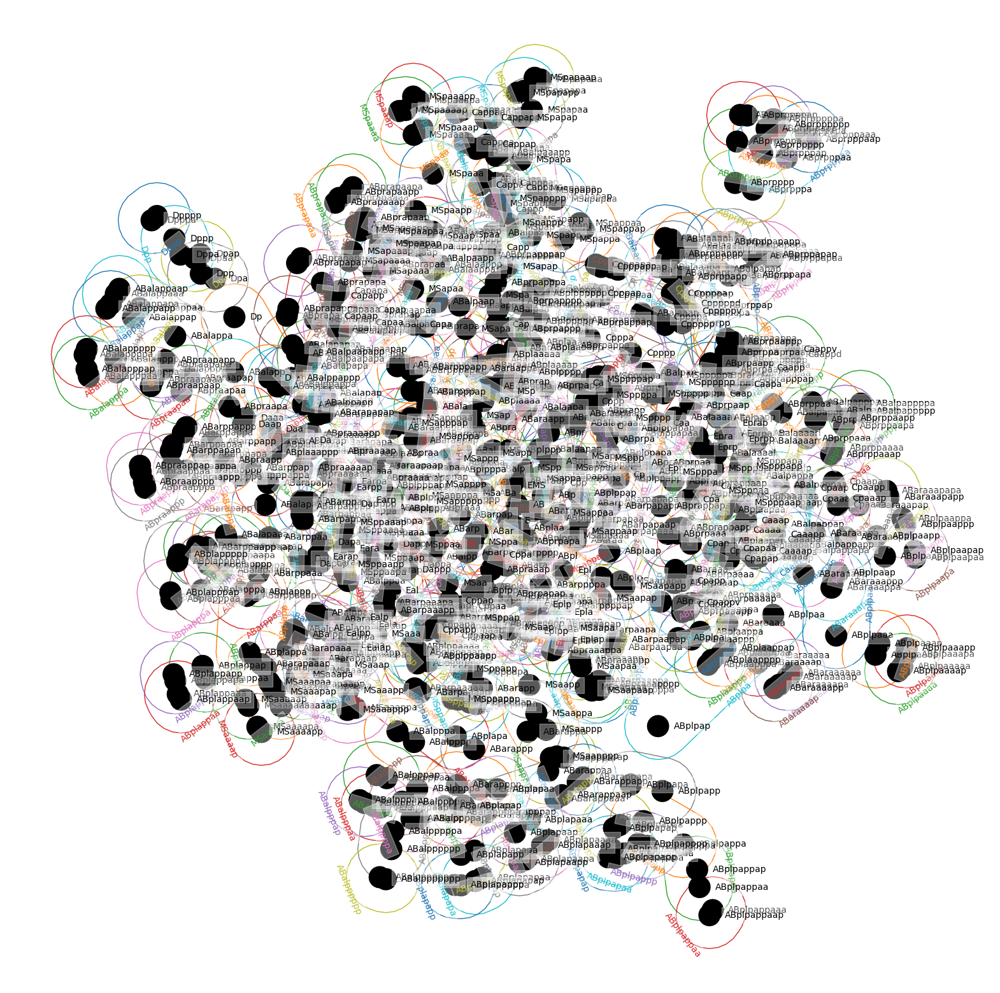

In [140]:
plt.subplots(figsize=(20, 20))
hnx.draw(H)

## Dynamic Hyperedges

In [144]:
ce_raw_data['time'].min(), ce_raw_data['time'].max()

(np.int64(-16), np.int64(190))

In [147]:
ce_raw_data['time'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

## Doubts:
1. What is the difference between Hypernode and hyperedge?
- hypernode: single node (collection of nodes) - treated as single entity (node)

1. Documention of decisions about libraries and methods (DBSCAN)
2. Pick out subsets of data: at time points (subpapel in different ways): time points, lineage data, etc.: see subset evoultion
3. Visualizations